<div style="border-radius: 30px 0 30px 0px; border: 2px solid #00ea98; padding: 20px; background-color: #0a141b; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2); width: 60%; margin: auto;">
    <h1 style="color: #7ab052; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 36px;">🍅🍃 Tomato Leaf  Desease Classification</h1>
</div>


<div style="border-radius: 30px 0 30px 0px; border: 2px solid #00ea98; padding: 20px; background-color: #0a141b; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2); width: 60%; margin: auto;">
    <h1 style="color: #7ab052; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px;">Importing The Libraries</h1>
</div>

In [56]:
!pip install mplcursors

In [57]:
from tensorflow.keras.applications import DenseNet121, EfficientNetB4, Xception, VGG16, VGG19
from tensorflow.keras.layers import Dense, Flatten, Dropout, GlobalAveragePooling2D, AveragePooling2D, MaxPooling2D, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
import tensorflow as tf
import mplcursors
from tensorflow.keras import models, layers
from tensorflow.keras import Sequential, layers, models
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.image as mpimg
import numpy as np
import os
import shutil
from collections import Counter
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc
from sklearn.model_selection import train_test_split
import warnings

warnings.filterwarnings('ignore')

<div style="border-radius: 30px 0 30px 0px; border: 2px solid #00ea98; padding: 20px; background-color: #0a141b; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2); width: 60%; margin: auto;">
    <h1 style="color: #7ab052; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px;">Evaluation Plotter</h1>
</div>

In [58]:
def plot_plots(data):
    plt.style.use('dark_background')

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

    ax1.plot(data['loss'], color='cyan', linewidth=2, label='Training Loss')
    ax1.plot(data['val_loss'], color='magenta', linewidth=2, label='Validation Loss')
    ax1.set_xlabel('Epochs', color='white')
    ax1.set_ylabel('Loss', color='white')
    ax1.set_title('Loss Over Epochs', color='white')
    ax1.tick_params(axis='y', colors='white')
    ax1.legend(loc='upper right', facecolor='black', edgecolor='white', fontsize=10)
    ax1.grid(color='gray', linestyle='--', linewidth=0.5)
    mplcursors.cursor(ax1, hover=True)

    ax2.plot(data['accuracy'], color='lime', linewidth=2, label='Training Accuracy')
    ax2.plot(data['val_accuracy'], color='orange', linewidth=2, label='Validation Accuracy')
    ax2.set_xlabel('Epochs', color='white')
    ax2.set_ylabel('Accuracy', color='white')
    ax2.set_title('Accuracy Over Epochs', color='white')
    ax2.tick_params(axis='y', colors='white')
    ax2.legend(loc='lower right', facecolor='black', edgecolor='white', fontsize=10)
    ax2.grid(color='gray', linestyle='--', linewidth=0.5)
    mplcursors.cursor(ax2, hover=True)

    plt.tight_layout()
    plt.show()

<div style="border-radius: 30px 0 30px 0px; border: 2px solid #00ea98; padding: 20px; background-color: #0a141b; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2); width: 60%; margin: auto;">
    <h1 style="color: #7ab052; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px;">Download Dataset from ==> <a href = "https://www.kaggle.com/datasets/kaustubhb999/tomatoleaf/data"> Kaggle </a><br></h1>
</div>

### **Unzip Folder**

In [3]:
!unzip Tomato.zip -d Tomato

Streaming output truncated to the last 5000 lines.
  inflating: Tomato/tomato/train/Tomato___Target_Spot/002213fb-b620-4593-b9ac-6a6cc119b100___Com.G_TgS_FL 8360.JPG  
  inflating: Tomato/tomato/train/Tomato___Target_Spot/0044d10f-7062-4655-8abd-9fffc5b2f152___Com.G_TgS_FL 7908.JPG  
  inflating: Tomato/tomato/train/Tomato___Target_Spot/00854623-ba28-446d-a1d5-03c0ae3f99d9___Com.G_TgS_FL 7949.JPG  
  inflating: Tomato/tomato/train/Tomato___Target_Spot/0118c27a-f34a-41e1-8b2f-d2c564f83c5c___Com.G_TgS_FL 0013.JPG  
  inflating: Tomato/tomato/train/Tomato___Target_Spot/0118ed61-b135-45be-ad81-7e2d54203be4___Com.G_TgS_FL 8241.JPG  
  inflating: Tomato/tomato/train/Tomato___Target_Spot/0197df47-a9cb-4b6c-b72c-ac0e9af6d135___Com.G_TgS_FL 0779.JPG  
  inflating: Tomato/tomato/train/Tomato___Target_Spot/025510ac-15db-4861-b02b-21da82161100___Com.G_TgS_FL 0952.JPG  
  inflating: Tomato/tomato/train/Tomato___Target_Spot/0288164e-d6cf-4215-b593-7b581308a4cf___Com.G_TgS_FL 9777.JPG  
  inflating: 

<div style="border-radius: 30px 0 30px 0px; border: 2px solid #00ea98; padding: 20px; background-color: #0a141b; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);width: 60%; margin: auto;">
    <h1 style="color: #7ab052; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px;">Loading The DataSet</h1>
</div>

**WORKING**
- The `image_dataset_from_directory` function is used to load image data from a directory.
- Images are resized to 256x256 pixels and grouped into batches of 32 for training efficiency.
- Labels are inferred from the directory structure and represented in a categorical format.
- Pixel values of the images are normalized to a range of [0, 1] by dividing by 255.0.

In [4]:
train_data = tf.keras.utils.image_dataset_from_directory(
    '/content/Tomato/tomato/train',
    labels='inferred',
    label_mode='categorical',
    image_size=(256, 256),
    batch_size=32
)
train_data = train_data.map(lambda x, y: (x / 255.0, y))

Found 10000 files belonging to 10 classes.


**WORKING**
- The image_dataset_from_directory function is used to load validation image data from a directory.
- Images are resized to 256x256 pixels and grouped into batches of 32 for efficient processing.
- Labels are inferred from the directory structure and represented in a categorical format.
- Pixel values of the images are normalized to a range of [0, 1] by dividing by 255.0 for consistent model training.

In [5]:
val_data = tf.keras.utils.image_dataset_from_directory(
    '/content/Tomato/tomato/val',
    labels='inferred',
    label_mode='categorical',
    image_size=(256, 256),
    batch_size=32
    )
val_data = val_data.map(lambda x, y: (x / 255.0, y))

Found 1000 files belonging to 10 classes.


<div style="border-radius: 30px 0 30px 0px; border: 2px solid #00ea98; padding: 20px; background-color: #0a141b; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);width: 60%; margin: auto;">
    <h1 style="color: #7ab052; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px;">Visualizing The Data</h1>
</div>

In [21]:
def visualize_imgs(file_path):
    image_files = [f for f in os.listdir(file_path) if os.path.isfile(os.path.join(file_path, f))]
    class_label = os.path.basename(file_path)
    fig, axs = plt.subplots(1, 3, figsize=(13, 10))
    for i in range(3):
        image_file = image_files[i]
        img_path = os.path.join(file_path, image_file)
        img = mpimg.imread(img_path)
        ax = axs[i]
        ax.imshow(img)
        ax.axis('off')
        ax.set_title(class_label)
    plt.tight_layout()
    plt.show()

**WORKING**

- The code sets the `path to a directory containing images` of tomato leaves affected by the Tomato Yellow Leaf Curl Virus and so on in the next cells of code.
- It retrieves a list of all image file names in the directory.
- Using matplotlib, it displays the first 6 images along with their corresponding labels.
- For each image, it loads the image, displays it in a subplot, and sets the title to the image label, showing the visual representation of the dataset.

In [23]:
os.listdir('/content/Tomato/tomato/train')

['Tomato___Early_blight',
 'Tomato___Target_Spot',
 'Tomato___Leaf_Mold',
 'Tomato___Septoria_leaf_spot',
 'Tomato___Tomato_Yellow_Leaf_Curl_Virus',
 'Tomato___Tomato_mosaic_virus',
 'Tomato___Bacterial_spot',
 'Tomato___Late_blight',
 'Tomato___Spider_mites Two-spotted_spider_mite',
 'Tomato___healthy']

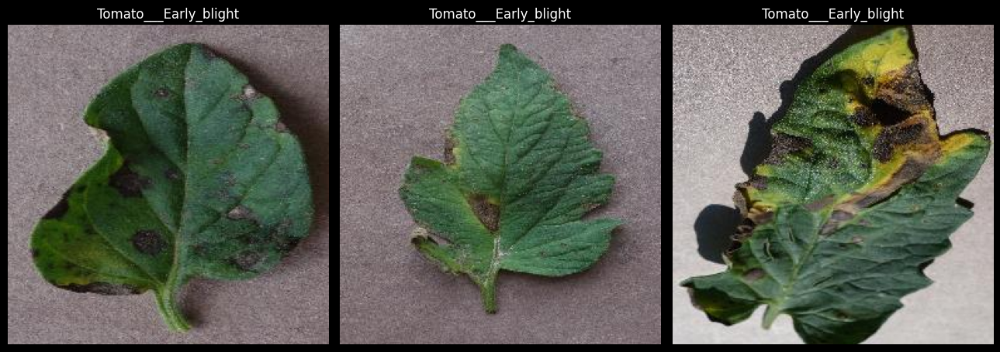

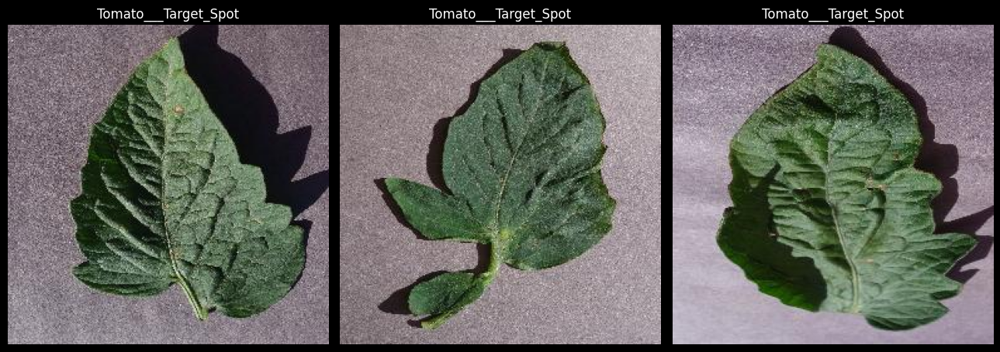

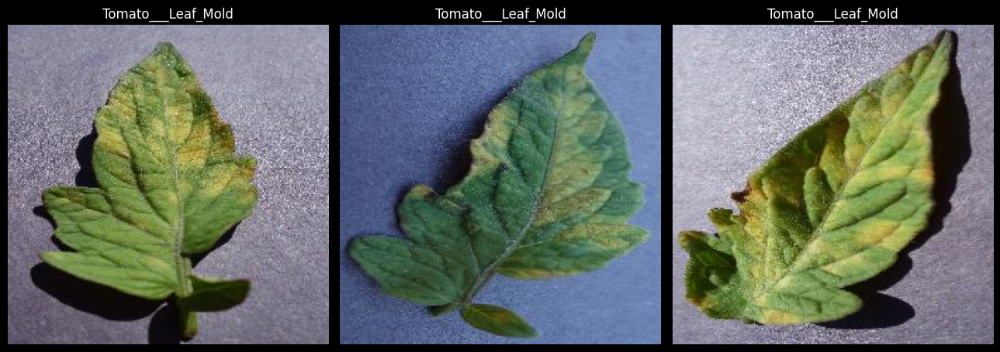

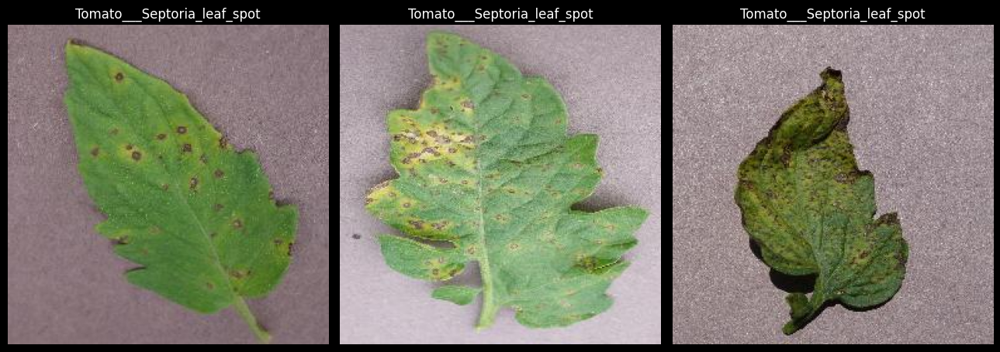

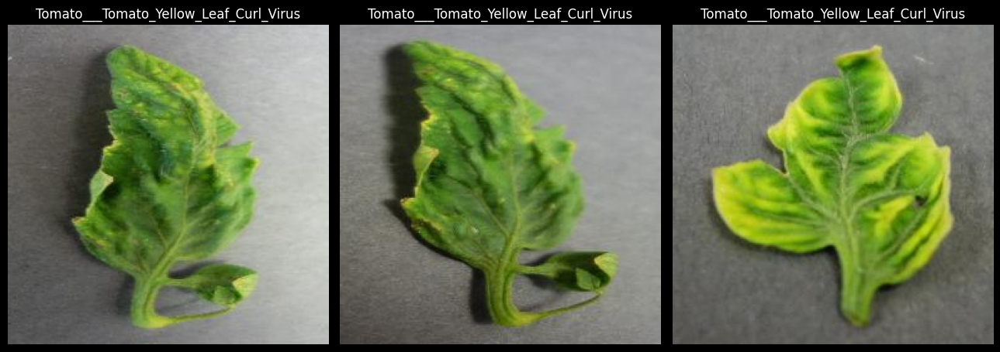

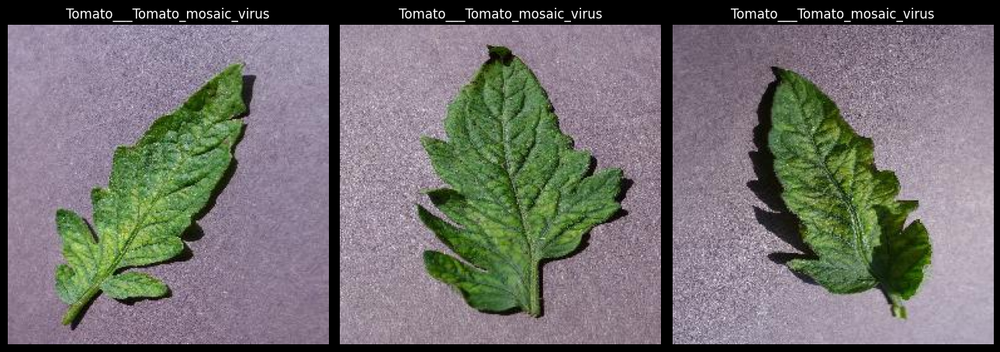

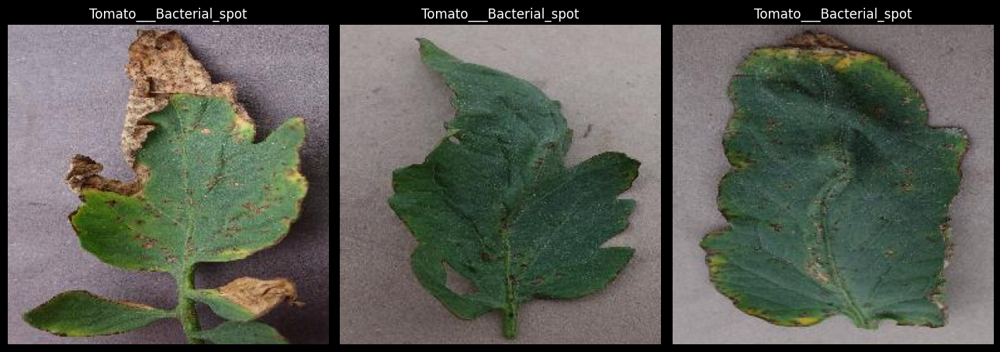

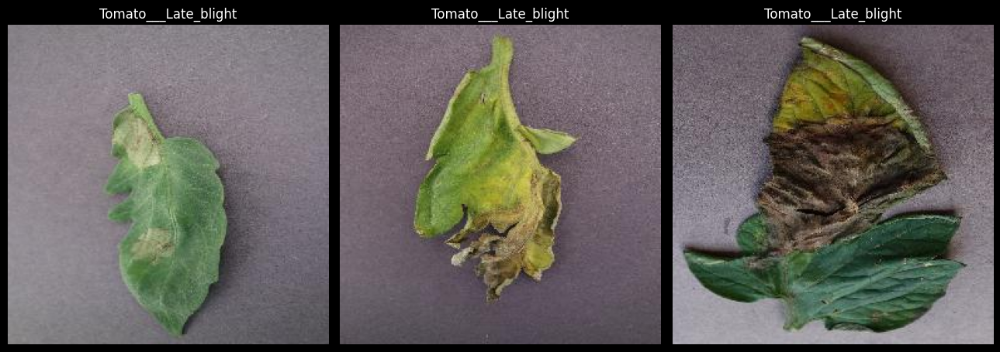

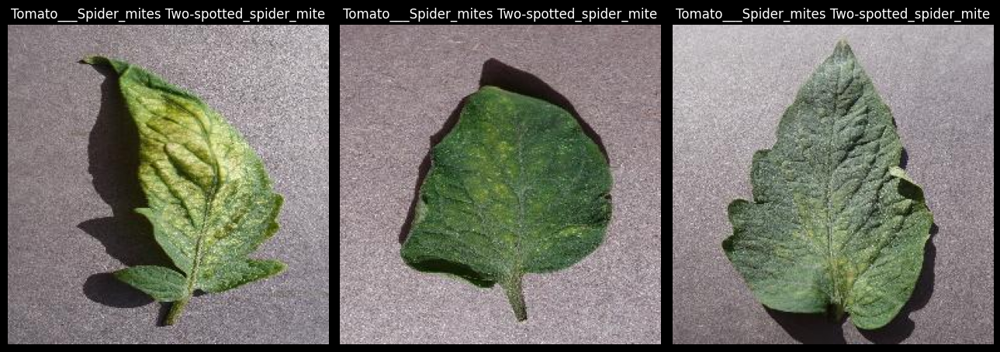

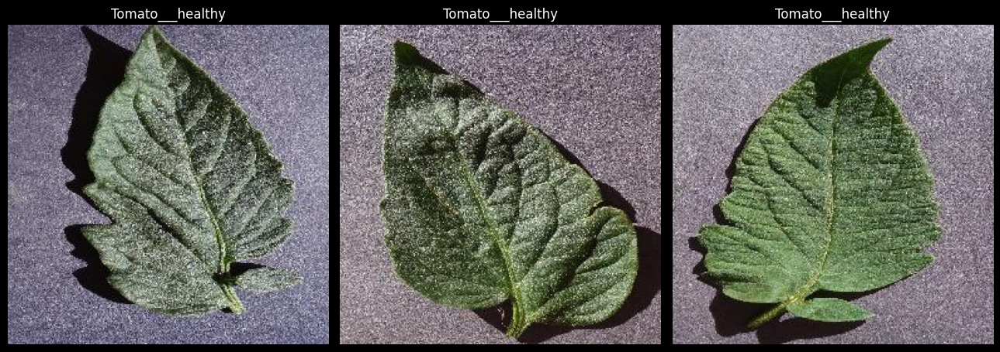

In [61]:
for i in os.listdir('/content/Tomato/tomato/train'):
  visualize_imgs(f'/content/Tomato/tomato/train/{i}')

<div style="border-radius: 30px 0 30px 0px; border: 2px solid #00ea98; padding: 20px; background-color: #0a141b; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);width: 60%; margin: auto;">
    <h1 style="color: #7ab052; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px;">Training The Model</h1>
</div>

**WORKING**
- The code initializes a `DenseNet121` model with weights pre-trained on the ImageNet dataset.
- The `include_top=False argument` specifies that the model should not include the fully connected layers at the top of the network, which are typically used for ImageNet classification.
- The `input_shape=(256,256,3) argument` specifies the shape of the input images that the model expects, which is `256x256` pixels with 3 channels (RGB).
- The initialized model `conv_base` can be used as a feature extractor to extract features from images, which can then be used as input to a custom classification head.

In [36]:
base_model = DenseNet121(
    weights='imagenet',
    include_top = False,
    input_shape=(256, 256, 3),
    pooling='avg'
)

**WHY FALSE ?**
- Setting conv_base.trainable = False freezes the weights of the pre-trained DenseNet121 model.
- This is done to prevent the weights from being updated during the training of the custom classification head.
- Freezing the pre-trained weights helps in utilizing the learned features from the ImageNet dataset without altering them.
- It also reduces the computational cost and training time, as only the weights of the custom classification head will be trained.

In [37]:
base_model.trainable = False

In [39]:
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip('horizontal'),
    tf.keras.layers.RandomRotation(0.2),
    tf.keras.layers.RandomZoom(0.2),
])

**WORKING**

- It initializes a Sequential model and adds the `pre-trained` DenseNet121` model (base_model) ` as the base.
- The model flattens the output from the base model and adds two fully connected layers with `ReLU activation`.
- `Batch normalization` is applied after each fully connected layer to improve training stability and speed.

In [44]:
model = Sequential()
model.add(base_model)
model.add(BatchNormalization())
model.add(Dense(256, activation='relu'))
model.add(Dropout(0.35))
model.add(BatchNormalization())
model.add(Dense(120, activation='relu'))
model.add(Dense(10, activation='softmax'))

**WORKING**

- The compile method is used to configure the model for training.
- The optimizer=Adam(learning_rate=0.0001) argument specifies the Adam optimizer with a learning rate of 0.0001.
- The loss='categorical_crossentropy' argument specifies the loss function used for training, which is categorical crossentropy for multi-class classification.
- The metrics=['accuracy'] argument specifies the metric used to evaluate the model, which is accuracy in this case.

In [45]:
model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

**WORKING**
- The `fit` method is used to train the model on the training data (`train_data`) for a specified number of epochs (100 in this case).
- The `validation_data=val_data` argument specifies the validation data to evaluate the model performance after each epoch.
- The `callbacks=[EarlyStopping(patience=0)]` argument specifies the use of early stopping to prevent overfitting. The training will stop if the validation loss does not improve after 0 epochs.
- The `history` variable stores the training history, including metrics such as loss and accuracy, which can be used for analysis and visualization.

In [46]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3)

In [47]:
history = model.fit(train_data, epochs=100, validation_data=val_data, callbacks=[early_stopping])

Epoch 1/100
313/313 ━━━━━━━━━━━━━━━━━━━━ 77s 187ms/step - accuracy: 0.3613 - loss: 1.9205 - val_accuracy: 0.7630 - val_loss: 0.8998
Epoch 2/100
313/313 ━━━━━━━━━━━━━━━━━━━━ 34s 108ms/step - accuracy: 0.7543 - loss: 0.7851 - val_accuracy: 0.8330 - val_loss: 0.5260
Epoch 3/100
313/313 ━━━━━━━━━━━━━━━━━━━━ 33s 106ms/step - accuracy: 0.8248 - loss: 0.5401 - val_accuracy: 0.8740 - val_loss: 0.3984
Epoch 4/100
313/313 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - accuracy: 0.8621 - loss: 0.4160 - val_accuracy: 0.8980 - val_loss: 0.3332
Epoch 5/100
313/313 ━━━━━━━━━━━━━━━━━━━━ 43s 107ms/step - accuracy: 0.8891 - loss: 0.3362 - val_accuracy: 0.9010 - val_loss: 0.2914
Epoch 6/100
313/313 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - accuracy: 0.9061 - loss: 0.2879 - val_accuracy: 0.9130 - val_loss: 0.2587
Epoch 7/100
313/313 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - accuracy: 0.9239 - loss: 0.2355 - val_accuracy: 0.9230 - val_loss: 0.2382
Epoch 8/100
313/313 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - accuracy: 0.9357 - los

<div style="border-radius: 30px 0 30px 0px; border: 2px solid #00ea98; padding: 20px; background-color: #0a141b; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2); width: 60%; margin: auto;">
    <h1 style="color: #7ab052; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px;">Model Evaluation</div>

In [48]:
evaluate = model.evaluate(val_data)

32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 89ms/step - accuracy: 0.9557 - loss: 0.1436


In [59]:
import pandas as pd
result_adam = pd.DataFrame(history.history)
result_adam.tail(5)

,accuracy,loss,val_accuracy,val_loss
15,0.9666,0.099700,0.952,0.155003
16,0.9735,0.086018,0.952,0.147049
17,0.9738,0.077338,0.950,0.153092
18,0.9771,0.070029,0.953,0.158440
19,0.9812,0.064974,0.950,0.154968


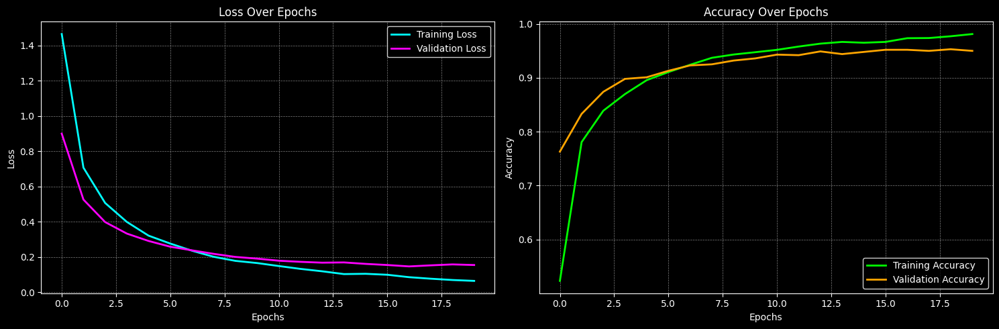

In [60]:
plot_plots(result_adam)


# **😌 Validation Accuracy 95%**:
  - Means that, when the model is evaluated on a separate set of data that it has not seen during training or validation, it correctly predicts the outcome 94% of the time. This is a good result and indicates that the model is performing well and generalizes well to new, unseen data.

In [49]:
print("Validation Loss:", evaluate[0])
print(f"Validation Accuracy: {evaluate[1]*100:.2f}%")

Validation Loss: 0.15496782958507538
Validation Accuracy: 95.00%


### **Confusion Matrix**

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━

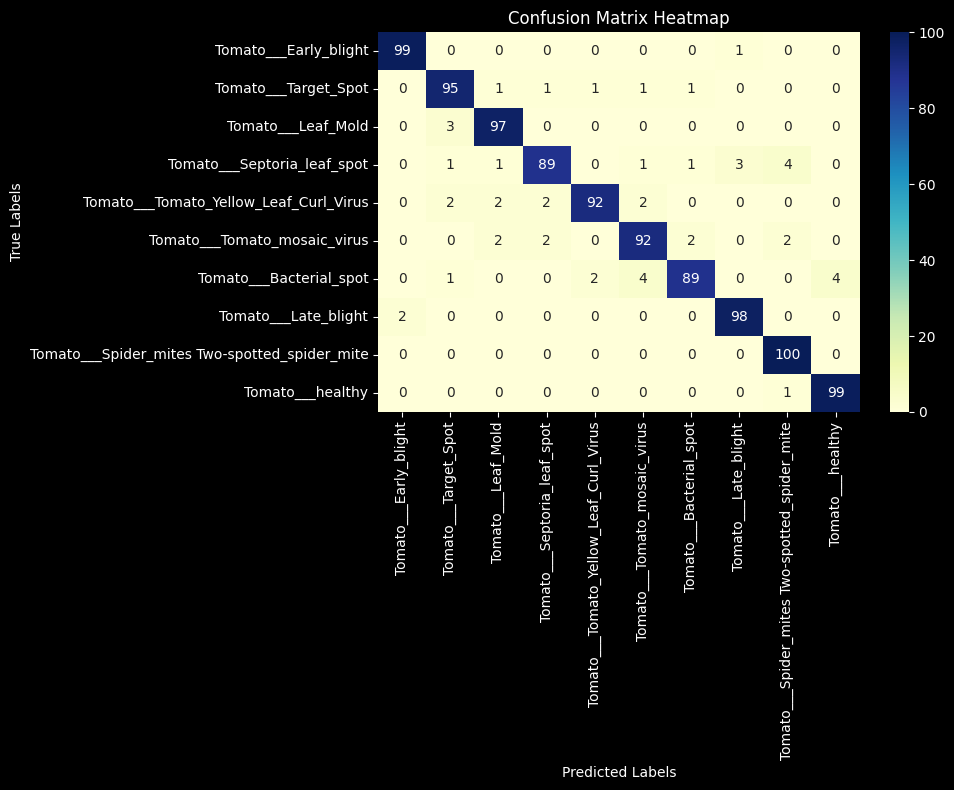

In [62]:
class_names = os.listdir('/content/Tomato/tomato/val')

true_labels = []
predicted_labels = []
predicted_probs = []

for images, labels in val_data:
    preds = model.predict(images)
    predicted_probs.extend(preds)
    predicted_labels.extend(np.argmax(preds, axis=1))
    true_labels.extend(np.argmax(labels, axis=1))

conf_matrix = confusion_matrix(true_labels, predicted_labels)

plt.figure(figsize=(10, 8))
sns.heatmap(
    conf_matrix,
    annot=True,
    fmt='d',

    cmap='YlGnBu',
    xticklabels=class_names,
    yticklabels=class_names
)
plt.title("Confusion Matrix Heatmap")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.tight_layout()
plt.show()

### **Classification Report**

In [55]:
report = classification_report(true_labels, predicted_labels, target_names=class_names)
print(report)

                                               precision    recall  f1-score   support

                        Tomato___Early_blight       0.98      0.99      0.99       100
                         Tomato___Target_Spot       0.93      0.95      0.94       100
                           Tomato___Leaf_Mold       0.94      0.97      0.96       100
                  Tomato___Septoria_leaf_spot       0.95      0.89      0.92       100
       Tomato___Tomato_Yellow_Leaf_Curl_Virus       0.97      0.92      0.94       100
                 Tomato___Tomato_mosaic_virus       0.92      0.92      0.92       100
                      Tomato___Bacterial_spot       0.96      0.89      0.92       100
                         Tomato___Late_blight       0.96      0.98      0.97       100
Tomato___Spider_mites Two-spotted_spider_mite       0.93      1.00      0.97       100
                             Tomato___healthy       0.96      0.99      0.98       100

                                     accu

<div style="border-radius: 30px 0 30px 0px; border: 2px solid #00ea98; padding: 20px; background-color: #0a141b; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2); width: 60%; margin: auto;">
    <h1 style="color: #7ab052; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px;">Save Model</div>

In [63]:
model.save('tomato_desease_classifier_v1.h5')